In [1]:
# Installing the dataset - Need kaggle.json file
#!pip install kaggle
#! mkdir ~/.kaggle
#! cp kaggle.json ~/.kaggle/
#! chmod 600 ~/.kaggle/kaggle.json
#! kaggle datasets download chrisfilo/fruit-recognition
#! unzip fruit-recognition.zip -d archive -p
#! mkdir archive
#! unzip fruit-recognition.zip -d archive

In [2]:
# Required libraries
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
%matplotlib inline
import os
import cv2
import cv2 as cv
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
import imgaug.augmenters as iaa


In [3]:
# Fixed Seed
np.random.seed(1)

# Read images from folder
def load_images_from_folder(folder,only_path = False, label = ""):
    if only_path == False:
        images = []
        for filename in os.listdir(folder):
            img = plt.imread(os.path.join(folder,filename))
            if img is not None:
                images.append(img)
        return images
    else:
        path = []
        for filename in os.listdir(folder):
            img_path = os.path.join(folder,filename)
            if img_path is not None:
                path.append([label,img_path])
        return path

In [4]:
# Get images from every folder
images = []
dirp = "/content/archive/"
for f in os.listdir(dirp):
    if "png" in os.listdir(dirp+f)[0]:
        images += load_images_from_folder(dirp+f,True,label = f)
    else: 
        for d in os.listdir(dirp+f):
            images += load_images_from_folder(dirp+f+"//"+d,True,label = f)
            
img_df = pd.DataFrame(images, columns = ["Type", "Filepath"])

from sklearn.utils import shuffle
# Shuffling the data and their indexes
img_df = shuffle(img_df, random_state = 0) # randomization will be the same each time this code is run with the same DataFrame.
img_df = img_df.reset_index(drop=True) # DataFrame has a fresh index after the rows have been shuffled.

# Each fruit type gets a unique number
fruit_names = sorted(img_df.Type.unique()) #sorts this list of unique fruit names in alphabetical order and assigns it to the variable fruit_names
mapper_fruit_names = dict(zip(fruit_names, [t for t in range(len(fruit_names))]))
img_df["label"] = img_df["Type"].map(mapper_fruit_names)
print(mapper_fruit_names)

img_df

{'Apple': 0, 'Banana': 1, 'Carambola': 2, 'Guava': 3, 'Kiwi': 4, 'Mango': 5, 'Orange': 6, 'Peach': 7, 'Pear': 8, 'Persimmon': 9, 'Pitaya': 10, 'Plum': 11, 'Pomegranate': 12, 'Tomatoes': 13, 'muskmelon': 14}


,Type,Filepath,label
0,Orange,/content/archive/Orange/Orange002446.png,6
1,Orange,/content/archive/Orange/Orange001666.png,6
2,Apple,/content/archive/Apple//Apple F/Apple F _0_461...,0
3,Mango,/content/archive/Mango/Mango001937.png,5
4,Peach,/content/archive/Peach/Peach00611.png,7
...,...,...,...
70544,Guava,/content/archive/Guava//Guava total/GuavaуАВ12...,3
70545,Apple,/content/archive/Apple//Apple C/Apple Ce03061.png,0
70546,Apple,/content/archive/Apple//Apple E/Apple E58.png,0
70547,Apple,/content/archive/Apple//Apple F/scene07861.png,0


In [5]:
# Train + validation dataset
dataset = img_df.iloc[0:14109]

In [6]:
dataset

,Type,Filepath,label
0,Orange,/content/archive/Orange/Orange002446.png,6
1,Orange,/content/archive/Orange/Orange001666.png,6
2,Apple,/content/archive/Apple//Apple F/Apple F _0_461...,0
3,Mango,/content/archive/Mango/Mango001937.png,5
4,Peach,/content/archive/Peach/Peach00611.png,7
...,...,...,...
14104,Orange,/content/archive/Orange/Orange002675.png,6
14105,Guava,/content/archive/Guava//Guava total/1GuavaуАВ2...,3
14106,Guava,/content/archive/Guava//Guava total/GuavaуАВ71...,3
14107,Orange,/content/archive/Orange/Orange002153.png,6


In [7]:
# Resize and flatten
def img_to_array(img_path):
    return cv2.resize(cv2.imread(img_path), (50, 50)).flatten()
    
dataset['pixel'] = dataset['Filepath'].apply(img_to_array)
dataset.head()

<ipython-input-7-653c5c5f7c31>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset['pixel'] = dataset['Filepath'].apply(img_to_array)


,Type,Filepath,label,pixel
0,Orange,/content/archive/Orange/Orange002446.png,6,"[145, 157, 144, 157, 164, 160, 158, 164, 161, ..."
1,Orange,/content/archive/Orange/Orange001666.png,6,"[141, 149, 146, 154, 157, 155, 154, 154, 149, ..."
2,Apple,/content/archive/Apple//Apple F/Apple F _0_461...,0,"[56, 69, 60, 69, 67, 74, 44, 67, 50, 45, 61, 6..."
3,Mango,/content/archive/Mango/Mango001937.png,5,"[154, 146, 137, 143, 135, 126, 156, 152, 143, ..."
4,Peach,/content/archive/Peach/Peach00611.png,7,"[121, 121, 114, 115, 117, 110, 87, 91, 81, 114..."


In [8]:
# Preparing X and Y
X = dataset['pixel']
Y = dataset['label']
Y

0        6
1        6
2        0
3        5
4        7
        ..
14104    6
14105    3
14106    3
14107    6
14108    3
Name: label, Length: 14109, dtype: int64

In [9]:
# Train validation split
X_train, X_val, Y_train, Y_val = train_test_split(X, Y, train_size=0.8, stratify=Y, random_state=1)

# Test dataset
dataset_test = img_df.iloc[67013:70540]

dataset_test['pixel'] = dataset_test['Filepath'].apply(img_to_array)

X_test = dataset_test['pixel']
Y_test = dataset_test['label']

<ipython-input-9-f7923888059a>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset_test['pixel'] = dataset_test['Filepath'].apply(img_to_array)


In [10]:
Y_train

11663     3
6558      5
1109     14
6546      3
3742     13
         ..
7278     14
1850      0
7064      4
6560      8
4745      5
Name: label, Length: 11287, dtype: int64

In [11]:
#converts list of arrays into a single NumPy array with an additional dimension
# scaling is done to normalize the range of features so that they have similar magnitudes, which can help improve the performance
X_train = np.stack(X_train)
scaler = StandardScaler()
scaler.fit(X_train) # fits the scaler to the training data X_train, which computes the mean and standard deviation of each feature in X_train.
X_train_norm = scaler.transform(X_train)
X_test = scaler.transform(np.stack(X_test))

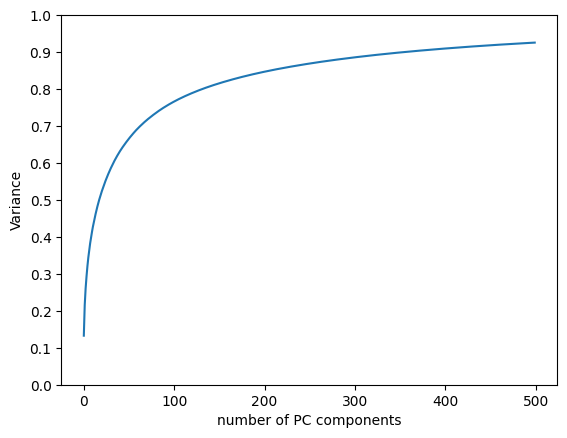

In [12]:
# Applying PCA
pca = PCA(n_components=500)
pca.fit(X_train)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of PC components')
plt.yticks([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1])
plt.ylabel('Variance')
plt.show()

In [13]:
# Applying PCA train and test datasets
XP_train = pca.transform(X_train_norm)
XP_test = pca.transform(X_test)

In [14]:
XP_train2 = XP_train
XP_train2

array([[ 6.50681609e+03, -7.53440507e+03, -1.38454918e+03, ...,
        -2.49271221e+00, -2.24675516e+00,  7.31690075e+00],
       [ 6.49202744e+03, -7.57261150e+03, -1.33395074e+03, ...,
        -3.88764994e+00, -2.00930974e+00,  5.61843796e+00],
       [ 6.47392995e+03, -7.56157860e+03, -1.37893084e+03, ...,
        -2.40898324e+00, -9.50688209e-01,  8.29612651e+00],
       ...,
       [ 6.50684022e+03, -7.54213890e+03, -1.40826025e+03, ...,
        -3.08564947e+00, -3.19351876e+00,  7.70304656e+00],
       [ 6.53995921e+03, -7.57132225e+03, -1.35082282e+03, ...,
        -2.94608202e+00, -1.46516826e+00,  7.41052798e+00],
       [ 6.50246686e+03, -7.49839936e+03, -1.34536349e+03, ...,
         9.55990525e-02, -1.60026967e+00,  7.24821822e+00]])

In [15]:
# Fine Tuning
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import GridSearchCV
shuffle_split = ShuffleSplit(n_splits=1, test_size=0.2)
# This is equivalent to: 
#   X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)
# But, it is usable for GridSearchCV

# GridSearch without CV
params = {'n_estimators': [125, 100,75,50,25 ],
          'max_depth': [None, 10,30]
}
clf = RandomForestClassifier()
grid_search = GridSearchCV(clf, param_grid=params, cv=shuffle_split)
grid_search.fit(XP_train, Y_train)


GridSearchCV(cv=ShuffleSplit(n_splits=1, random_state=None, test_size=0.2, train_size=None),
             estimator=RandomForestClassifier(),
             param_grid={'max_depth': [None, 10, 30],
                         'n_estimators': [125, 100, 75, 50, 25]})

In [16]:
# Best hyperparameters
print(grid_search.best_estimator_.n_estimators)
print(grid_search.best_estimator_.max_depth)

100
30


In [17]:
# Random Forest model
clf = RandomForestClassifier(n_estimators=125, max_depth=None, random_state=0)
clf.fit(XP_train, Y_train)
XP_train_no_aug = XP_train
Y_train_no_aug = Y_train
Ypred_test = clf.predict(XP_test)

# Printing accuracy of the Random Forest model
accuracy = accuracy_score(Y_test, Ypred_test)
print("Accuracy:", accuracy)

Accuracy: 0.7195917210093564


In [18]:
# Written to test fine tuning is working fine or not.
sm = [25,50,75,100,125]
ac = []
for i in sm:
  model2 = RandomForestClassifier(n_estimators=i,max_depth=100, random_state=0)

  model2.fit(XP_train, Y_train)
  pred = model2.predict(XP_test)
  accuracy = accuracy_score(Y_test, pred)
  ac.append(accuracy)
print("Accuracy:", ac)

Accuracy: [0.6668556847178906, 0.6960589736319819, 0.706265948398072, 0.711652962857953, 0.7195917210093564]


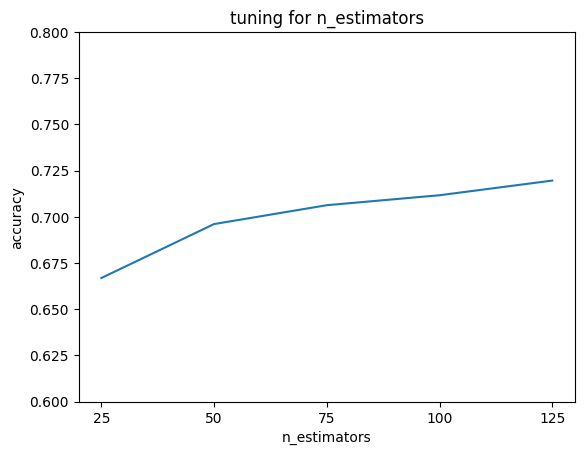

In [19]:
# Graph of accuract - n_estimators
ls = map(str, sm)
plt.plot(list(ls),ac)
  
# naming the x axis
plt.xlabel('n_estimators')
# naming the y axis
plt.ylabel('accuracy')
  
# giving a title to my graph
plt.title('tuning for n_estimators')
plt.ylim(0.6,0.8)
  
# function to show the plot
plt.show()

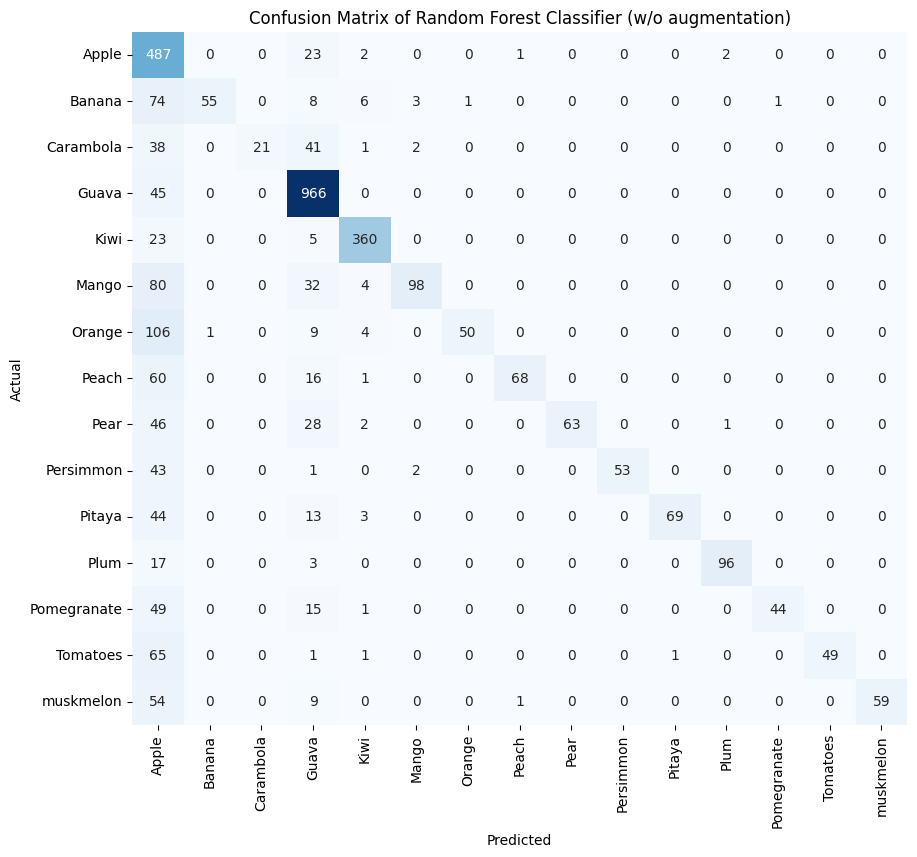

In [20]:
# Printing confusion matrix of random forest model
confusionMatrix = pd.DataFrame(confusion_matrix(Y_test, Ypred_test), columns=fruit_names, index = fruit_names)
confusionMatrix.index.name = 'Actual'
confusionMatrix.columns.name = 'Predicted'


plt.subplots(figsize=(10, 9))

sns.heatmap(confusionMatrix, cbar=False, annot=True, cmap="Blues", fmt='.0f')
plt.title('Confusion Matrix of Random Forest Classifier (w/o augmentation)')
plt.show()

In [21]:
# Printing performance metrics of random forest model
print("Performance Metrics of Random Forest Classifier:\n")
print(classification_report(Y_test, Ypred_test, target_names=fruit_names))

Performance Metrics of Random Forest Classifier:

              precision    recall  f1-score   support

       Apple       0.40      0.95      0.56       515
      Banana       0.98      0.37      0.54       148
   Carambola       1.00      0.20      0.34       103
       Guava       0.83      0.96      0.89      1011
        Kiwi       0.94      0.93      0.93       388
       Mango       0.93      0.46      0.61       214
      Orange       0.98      0.29      0.45       170
       Peach       0.97      0.47      0.63       145
        Pear       1.00      0.45      0.62       140
   Persimmon       1.00      0.54      0.70        99
      Pitaya       0.99      0.53      0.69       129
        Plum       0.97      0.83      0.89       116
 Pomegranate       0.98      0.40      0.57       109
    Tomatoes       1.00      0.42      0.59       117
   muskmelon       1.00      0.48      0.65       123

    accuracy                           0.72      3527
   macro avg       0.93      0

In [36]:
# Written To make sample predictions
dataset2 = dataset.copy() # Create a copy of the original dataset
dataset2['pixel'] = dataset2['Filepath'].apply(img_to_array) # Apply the img_to_array function to each image file path in the dataset, and store the resulting flattened image arrays in a new 'pixel' column in the dataset

dataset["label"] = dataset["Type"].map(mapper_fruit_names) # Map the fruit type names to integer labels and store the resulting labels in a new 'label_id' column in the original dataset
dataset.head() # Print the first few rows of the dataset to inspect the new columns


X = dataset2[['pixel', 'Filepath']] # Create a new dataframe X that contains the flattened image arrays and file paths
Y = dataset2['label'] # Create a new series Y that contains the integer labels

X_train, X_val, Y_train, Y_val = train_test_split(X, Y, train_size=0.8, stratify=Y, random_state=1) # Split the dataset into training and testing sets with a ratio of 80:20, stratified by the integer labels, and with a random state of 1

# Test dataset
dataset_test = img_df.iloc[67013:70540]

dataset_test['pixel'] = dataset_test['Filepath'].apply(img_to_array)

X_test = dataset_test[['pixel', 'Filepath']]
Y_test = dataset_test['label']

<ipython-input-36-586d69934fc0>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset["label"] = dataset["Type"].map(mapper_fruit_names) # Map the fruit type names to integer labels and store the resulting labels in a new 'label_id' column in the original dataset
<ipython-input-36-586d69934fc0>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset_test['pixel'] = dataset_test['Filepath'].apply(img_to_array)


In [37]:
images = X_test['Filepath']
images = images.reset_index(drop=True)
X_train = X_train.drop(['Filepath'], axis=1)
X_test = X_test.drop(['Filepath'], axis=1)

In [38]:
# This line of code stacks the flattened pixel values of each image in the X_train DataFrame,
# so that they form a 2D array where each row represents an image and each column represents a pixel.
X_train = np.stack(X_train['pixel']) 
scaler = StandardScaler()
scaler.fit(X_train)
X_train_norm = scaler.transform(X_train) #This centers the pixel values around 0 and scales them to have unit variance.
X_test = scaler.transform(np.stack(X_test['pixel']))


In [39]:
pca = PCA(n_components=500)
pca.fit(X_train)

PCA(n_components=500)

In [40]:
XP_train = pca.transform(X_train_norm)
XP_test = pca.transform(X_test)

In [41]:
XP_train_aug = np.concatenate((XP_train_no_aug, XP_train), axis=0) # create a single feature array that includes both sets of data
Y_train = np.concatenate((Y_train_no_aug, Y_train), axis=0) 
XP_train_aug.shape
clf_aug = RandomForestClassifier(n_estimators=125, max_depth=None, random_state=0)
clf_aug.fit(XP_train_aug, Y_train)

Ypred_test = clf_aug.predict(XP_test) #use the trained random forest classifier to make predictions on the test feature array (XP_test) and stores the predicted labels in Ypred_test.

In [42]:
Y_test = Y_test.reset_index(drop=True)
Y_test

0        3
1       11
2        0
3       14
4        5
        ..
3522     9
3523     3
3524     7
3525     3
3526    12
Name: label, Length: 3527, dtype: int64

In [43]:
Y_test = np.array(Y_test)
Y_test
X_test = np.array(X_test)
X_test.shape

(3527, 7500)

In [44]:
images = np.array(images)

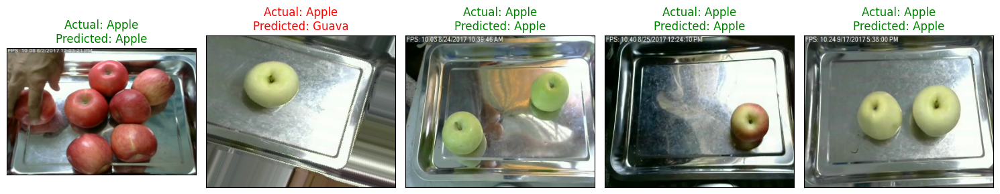

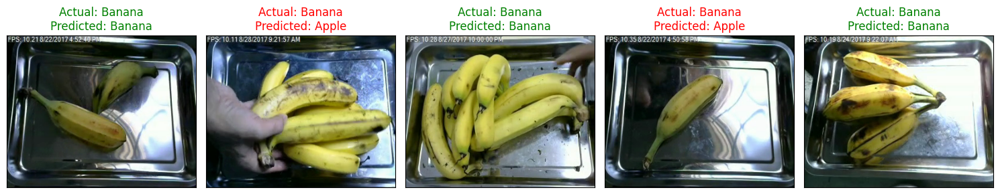

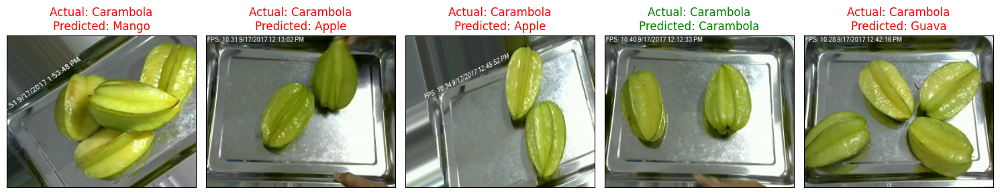

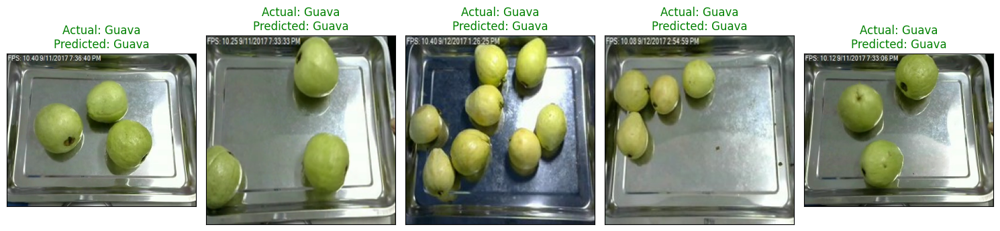

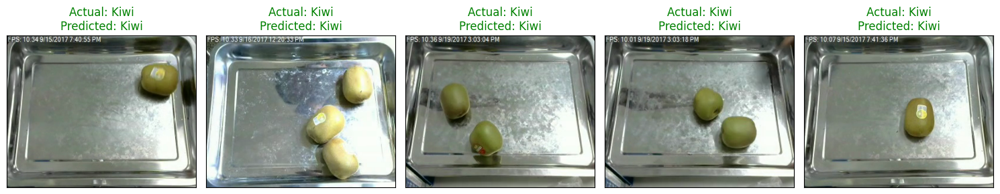

...

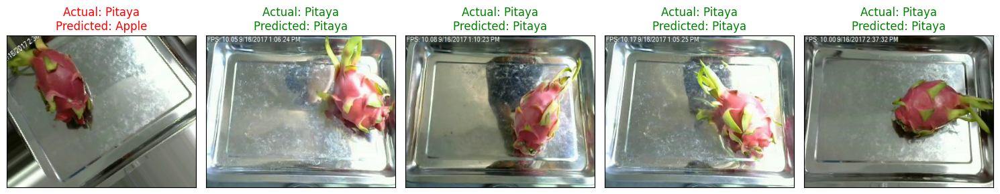

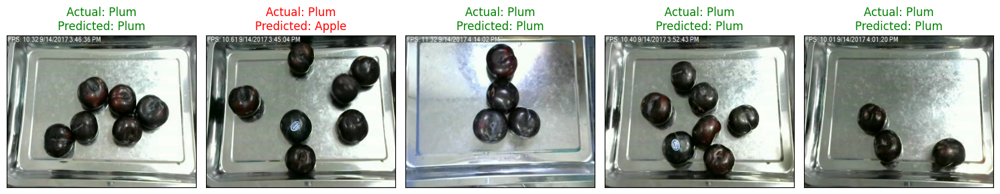

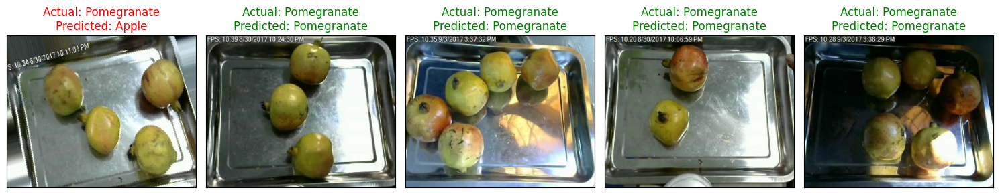

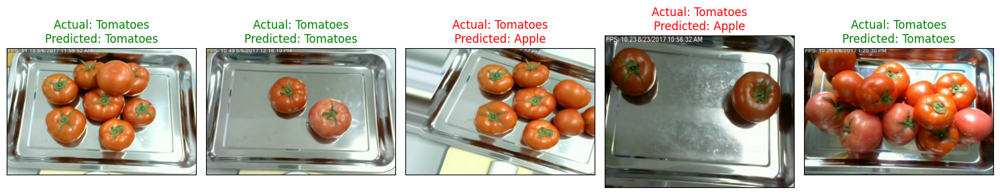

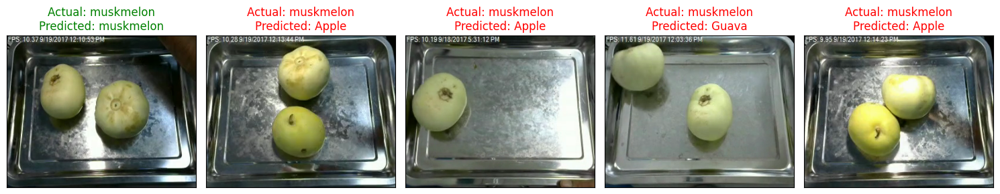

In [45]:
# Sample Predictions
x = 0
currFruit = fruit_names[x]
fruit = set()

for visitFruit in fruit_names:
  fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(15, 10), subplot_kw={'xticks': [], 'yticks': []})
  for i, ax in enumerate(axes.flat):
      for n in range(Y_test.size):
        if fruit_names[Y_test[-n]] is visitFruit and n not in fruit:
          fruit.add(n)
          img = cv.imread(images[-n])
          img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
          ax.imshow(img)
          #ax.imshow(images[-n])
          ax.set_title(f"Actual: {fruit_names[Y_test[-n]]}\nPredicted: {fruit_names[Ypred_test[-n]]}", color= "green" if fruit_names[Y_test[-n]] == fruit_names[Ypred_test[-n]] else "red" )
          break

  plt.tight_layout()
  plt.show()